In [1]:
import sys
import os
from glob import glob
sys.path.append("../NEAT")
from NEATModels import NEATStatic, nets
from NEATModels.Staticconfig  import static_config
from NEATUtils import helpers
from NEATUtils.helpers import save_json, load_json
os.environ["CUDA_VISIBLE_DEVICES"]="1"
os.environ["HDF5_USE_FILE_LOCKING"] = "FALSE"

Using TensorFlow backend.


In [2]:
npz_directory = '/home/sancere/Kepler/CurieTrainingDatasets/Dalmiro_Laura/LandmarkData/'
npz_name = 'Landmark128.npz'
npz_val_name = 'Landmark128Val.npz'


model_dir = '/home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/'
#Model name based on wether it is residual or sequntial ONEAT network
model_name = 'Landmark128K7s48d56.h5'


In [3]:
static_categories_json = model_dir + 'StaticCategories.json'
key_categories = load_json(static_categories_json)
static_cord_json = model_dir + 'StaticCord.json'
key_cord = load_json(static_cord_json)

#For ORNET use residual = True and for OSNET use residual = False
residual = False
#NUmber of starting convolutional filters, is doubled down with increasing depth
startfilter = 48
#CNN network start layer, mid layers and lstm layer kernel size
start_kernel = 7
mid_kernel = 7
#Network depth has to be 9n + 2, n= 3 or 4 is optimal for Notum dataset
depth = 56
#Size of the gradient descent length vector, start small and use callbacks to get smaller when reaching the minima
learning_rate = 1.0E-4
#For stochastic gradient decent, the batch size used for computing the gradients
batch_size = 10
# use softmax for single event per box, sigmoid for multi event per box
multievent = False
# Trainng image size
yolo_v0 = True
show = True
#Training epochs, longer the better with proper chosen learning rate
epochs = 250
nboxes = 1
#The inbuilt model stride which is equal to the nulber of times image was downsampled by the network
stride = 4
show = True
imagex = 128
imagey = 128

In [4]:
config = static_config(npz_directory =npz_directory, npz_name = npz_name, npz_val_name = npz_val_name, 
                         key_categories = key_categories, key_cord = key_cord, 
                         residual = residual, depth = depth, start_kernel = start_kernel, stride = stride, mid_kernel = mid_kernel,
                         startfiler = startfilter, nboxes = nboxes, gridx = 1, gridy = 1, show = show,
                         epochs = epochs, learning_rate = learning_rate, imagex = imagex, imagey = imagey,
                         batch_size = batch_size, model_name = model_name, yolo_v0 = yolo_v0, multievent = multievent)

config_json = config.to_json()

print(config)
save_json(config_json, model_dir + os.path.splitext(model_name)[0] + '_Parameter.json')

static_config(batch_size=10, box_vector=2, categories=2, depth=56, epochs=250, gridx=1, gridy=1, imagex=128, imagey=128, key_categories={'Background': 0, 'Landmark': 1}, key_cord={'x': 0, 'y': 1}, learning_rate=0.0001, mid_kernel=7, model_name='Landmark128K7s48d56.h5', multievent=False, nboxes=1, npz_directory='/home/sancere/Kepler/CurieTrainingDatasets/Dalmiro_Laura/LandmarkData/', npz_name='Landmark128.npz', npz_val_name='Landmark128Val.npz', residual=False, show=True, start_kernel=7, startfilter=32, stride=(4,), yolo_v0=True)


number of  images:	 4672
image size (2D):		 (128, 128)
axes:				 SXYC
channels in / out:		 1
number of  images:	 246
image size (2D):		 (128, 128)
axes:				 SXYC
channels in / out:		 1
loading weights
(4672, 1, 1, 4) 1
Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, None, 1 0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, None, None, 3 1600        input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, None, None, 3 128         conv2d_1[0][0]          

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where

Train on 4672 samples, validate on 246 samples
Epoch 1/250
4672/4672 [==============================] - 97s 21ms/step - loss: 0.5974 - accuracy: 0.9754 - val_loss: 0.5403 - val_accuracy: 0.9959

Epoch 00001: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.540264274046673, 'val_accuracy': 0.9959349632263184, 'loss': 0.5973574042014064, 'accuracy': 0.97538525, 'lr': 1e-04}


<Figure size 432x288 with 0 Axes>

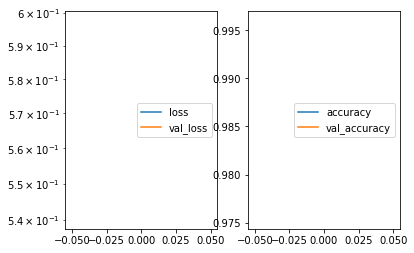

Predicted cell: Landmark Probability: [[0.9999999]]
True Cell type: Landmark
x [[0.6296087]]
True positional value x 0.578125
y [[0.43389946]]
True positional value y 0.421875


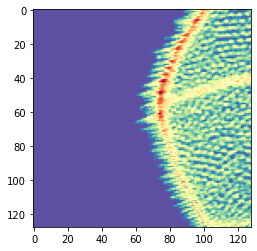

Epoch 2/250
4672/4672 [==============================] - 93s 20ms/step - loss: 0.5336 - accuracy: 0.9917 - val_loss: 0.5258 - val_accuracy: 0.9919

Epoch 00002: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.5257523248835307, 'val_accuracy': 0.9918699264526367, 'loss': 0.5336003364255167, 'accuracy': 0.99165237, 'lr': 1e-04}


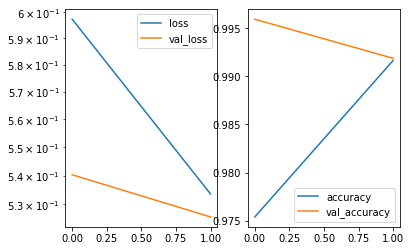

Predicted cell: Landmark Probability: [[0.9999093]]
True Cell type: Landmark
x [[0.52848583]]
True positional value x 0.578125
y [[0.49844068]]
True positional value y 0.578125


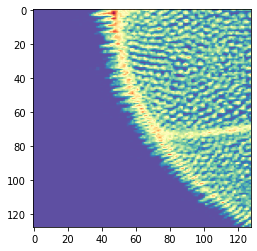

Epoch 3/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.5187 - accuracy: 0.9942 - val_loss: 0.5167 - val_accuracy: 1.0000

Epoch 00003: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.5166641643376855, 'val_accuracy': 1.0, 'loss': 0.5187403720050846, 'accuracy': 0.9942209, 'lr': 1e-04}


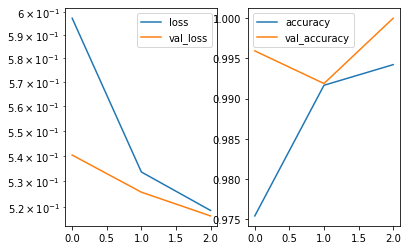

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.13453475]]
True positional value x 0.421875
y [[0.7070774]]
True positional value y 0.578125


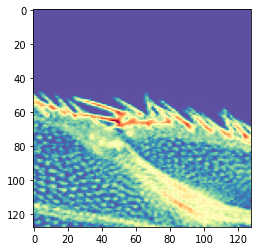

Epoch 4/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.5202 - accuracy: 0.9946 - val_loss: 0.5097 - val_accuracy: 1.0000

Epoch 00004: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.5097088324345225, 'val_accuracy': 1.0, 'loss': 0.520170211894055, 'accuracy': 0.994649, 'lr': 1e-04}


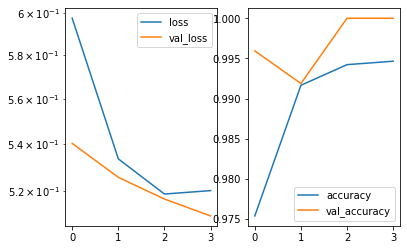

Predicted cell: Landmark Probability: [[0.99999905]]
True Cell type: Landmark
x [[0.37208834]]
True positional value x 0.34375
y [[0.67310745]]
True positional value y 0.65625


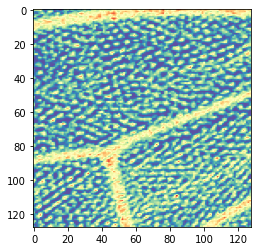

Epoch 5/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.5144 - accuracy: 0.9949 - val_loss: 0.5039 - val_accuracy: 1.0000

Epoch 00005: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.5039257470185194, 'val_accuracy': 1.0, 'loss': 0.5143690068300252, 'accuracy': 0.99486303, 'lr': 1e-04}


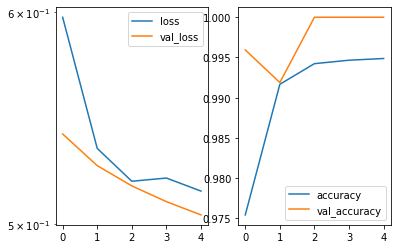

Predicted cell: Landmark Probability: [[0.9910659]]
True Cell type: Landmark
x [[0.4318585]]
True positional value x 0.34375
y [[0.4244109]]
True positional value y 0.34375


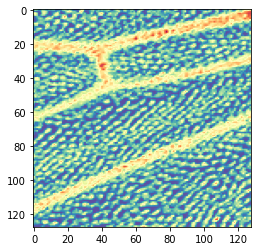

Epoch 6/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.5082 - accuracy: 0.9974 - val_loss: 0.5011 - val_accuracy: 1.0000

Epoch 00006: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.5010629805122934, 'val_accuracy': 1.0, 'loss': 0.5082035372799186, 'accuracy': 0.9974315, 'lr': 1e-04}


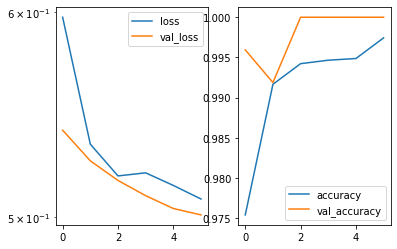

Predicted cell: Background Probability: [[0.9997776]]
True Cell type: Background
x [[0.52630156]]
True positional value x 0.5
y [[0.56316817]]
True positional value y 0.5


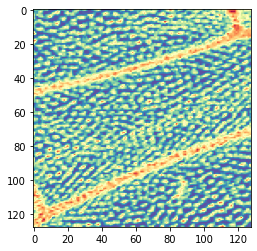

Epoch 7/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.5052 - accuracy: 0.9970 - val_loss: 0.5126 - val_accuracy: 0.9919

Epoch 00007: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.5125969219498518, 'val_accuracy': 0.9918699264526367, 'loss': 0.5051894314867789, 'accuracy': 0.99700344, 'lr': 1e-04}


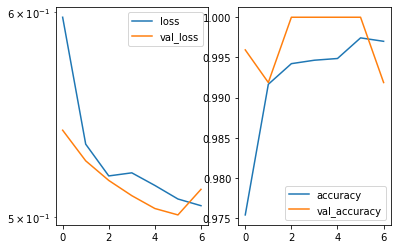

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.4552453]]
True positional value x 0.421875
y [[0.5576587]]
True positional value y 0.578125


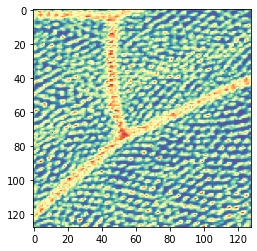

Epoch 8/250
4672/4672 [==============================] - 95s 20ms/step - loss: 0.5094 - accuracy: 0.9959 - val_loss: 0.5008 - val_accuracy: 1.0000

Epoch 00008: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.500793651594379, 'val_accuracy': 1.0, 'loss': 0.5094090810760039, 'accuracy': 0.99593323, 'lr': 1e-04}


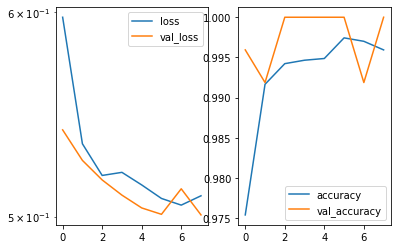

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.63049847]]
True positional value x 0.421875
y [[0.7445263]]
True positional value y 0.578125


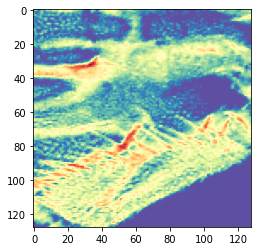

Epoch 9/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.5050 - accuracy: 0.9970 - val_loss: 0.4980 - val_accuracy: 1.0000

Epoch 00009: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.497954607252183, 'val_accuracy': 1.0, 'loss': 0.5050129401306175, 'accuracy': 0.99700344, 'lr': 1e-04}


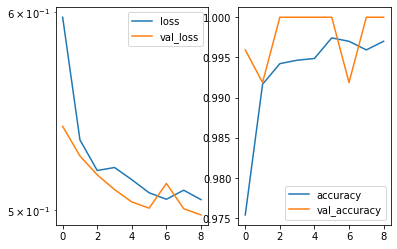

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.3333531]]
True positional value x 0.421875
y [[0.48257372]]
True positional value y 0.5


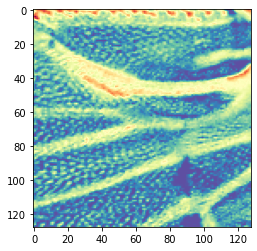

Epoch 10/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.5001 - accuracy: 0.9981 - val_loss: 0.4980 - val_accuracy: 0.9959

Epoch 00010: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.4980091641588909, 'val_accuracy': 0.9959349632263184, 'loss': 0.5000751198537342, 'accuracy': 0.99807364, 'lr': 1e-04}


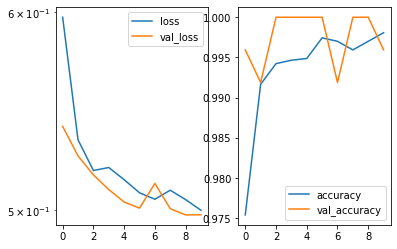

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.42683813]]
True positional value x 0.421875
y [[0.55393064]]
True positional value y 0.578125


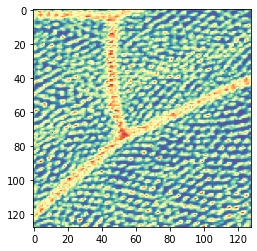

Epoch 11/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4965 - accuracy: 0.9983 - val_loss: 0.4957 - val_accuracy: 1.0000

Epoch 00011: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.49568992417033125, 'val_accuracy': 1.0, 'loss': 0.4964994313195348, 'accuracy': 0.9982877, 'lr': 1e-04}


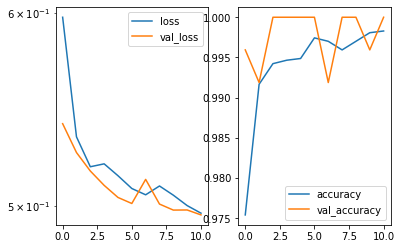

Predicted cell: Landmark Probability: [[0.99576205]]
True Cell type: Landmark
x [[0.66581625]]
True positional value x 0.6562499999999998
y [[0.67306226]]
True positional value y 0.65625


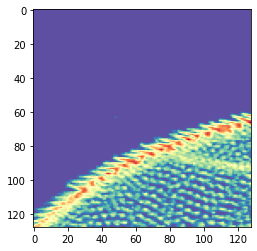

Epoch 12/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4921 - accuracy: 0.9996 - val_loss: 0.4919 - val_accuracy: 1.0000

Epoch 00012: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.4919442081354498, 'val_accuracy': 1.0, 'loss': 0.4921435669625867, 'accuracy': 0.9995719, 'lr': 1e-04}


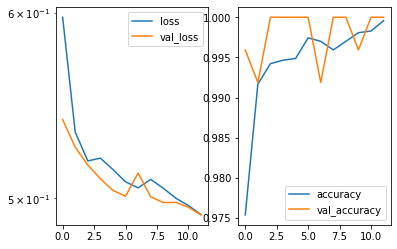

Predicted cell: Background Probability: [[0.9993082]]
True Cell type: Background
x [[0.5172232]]
True positional value x 0.5
y [[0.5373127]]
True positional value y 0.5


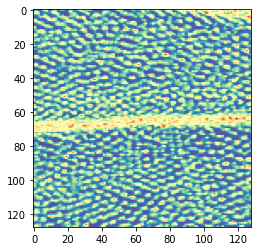

Epoch 13/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4922 - accuracy: 0.9989 - val_loss: 0.4903 - val_accuracy: 1.0000

Epoch 00013: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.49030410904225297, 'val_accuracy': 1.0, 'loss': 0.49220798281978256, 'accuracy': 0.9989298, 'lr': 1e-04}


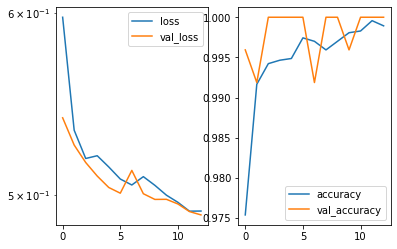

Predicted cell: Landmark Probability: [[0.9999931]]
True Cell type: Landmark
x [[0.54080904]]
True positional value x 0.578125
y [[0.4798354]]
True positional value y 0.5


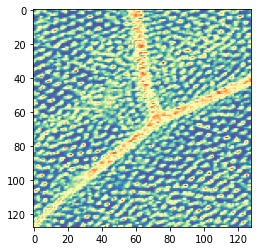

Epoch 14/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4902 - accuracy: 0.9991 - val_loss: 0.4964 - val_accuracy: 0.9959

Epoch 00014: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.49644877682856425, 'val_accuracy': 0.9959349632263184, 'loss': 0.4901773623024968, 'accuracy': 0.99914384, 'lr': 1e-04}


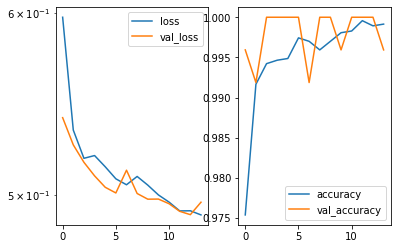

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.48415557]]
True positional value x 0.578125
y [[0.51143324]]
True positional value y 0.578125


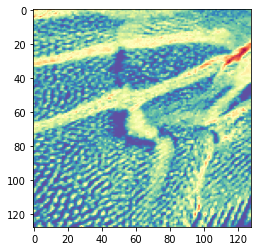

Epoch 15/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4887 - accuracy: 0.9991 - val_loss: 0.4932 - val_accuracy: 0.9959

Epoch 00015: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.4931829685602731, 'val_accuracy': 0.9959349632263184, 'loss': 0.4887468770452558, 'accuracy': 0.99914384, 'lr': 1e-04}


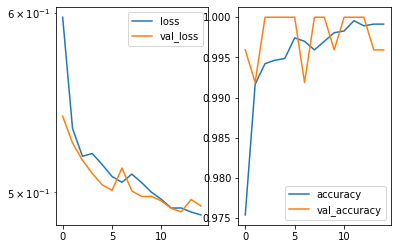

Predicted cell: Landmark Probability: [[0.99999785]]
True Cell type: Landmark
x [[0.40671265]]
True positional value x 0.421875
y [[0.3399425]]
True positional value y 0.421875


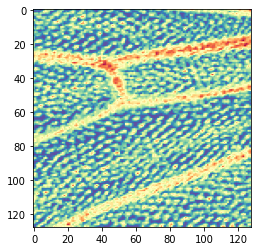

Epoch 16/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4877 - accuracy: 0.9996 - val_loss: 0.4864 - val_accuracy: 1.0000

Epoch 00016: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.4864134747322982, 'val_accuracy': 1.0, 'loss': 0.48772466718538166, 'accuracy': 0.9995719, 'lr': 1e-04}


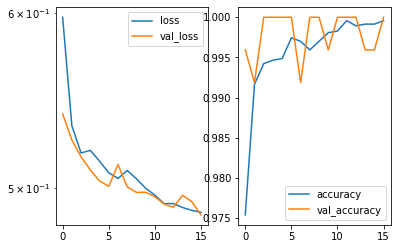

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.54506105]]
True positional value x 0.65625
y [[0.3744877]]
True positional value y 0.34375


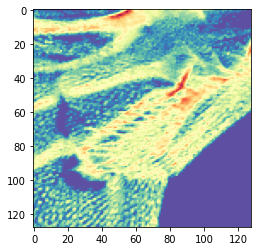

Epoch 17/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4859 - accuracy: 0.9996 - val_loss: 0.4877 - val_accuracy: 1.0000

Epoch 00017: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.48770935845568897, 'val_accuracy': 1.0, 'loss': 0.4859447627621767, 'accuracy': 0.9995719, 'lr': 1e-04}


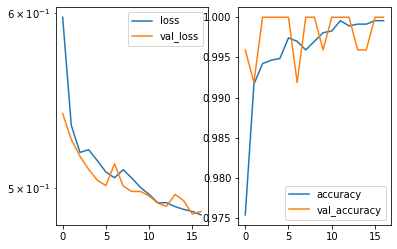

Predicted cell: Landmark Probability: [[0.9999999]]
True Cell type: Landmark
x [[0.41631025]]
True positional value x 0.5
y [[0.53258973]]
True positional value y 0.65625


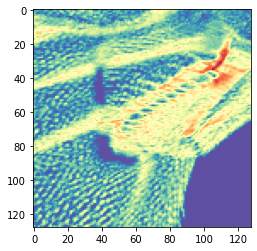

Epoch 18/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4845 - accuracy: 0.9998 - val_loss: 0.4847 - val_accuracy: 1.0000

Epoch 00018: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.48465401661105273, 'val_accuracy': 1.0, 'loss': 0.4845496230082561, 'accuracy': 0.99978596, 'lr': 1e-04}


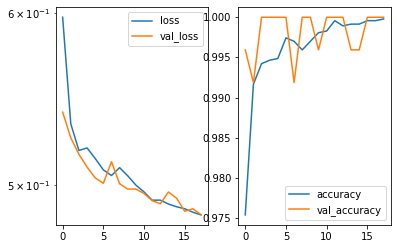

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.43875074]]
True positional value x 0.421875
y [[0.56321853]]
True positional value y 0.578125


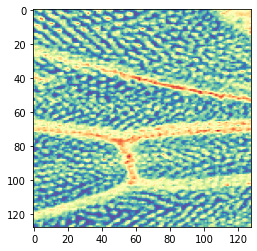

Epoch 19/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4841 - accuracy: 0.9994 - val_loss: 0.4833 - val_accuracy: 1.0000

Epoch 00019: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.4832561895614717, 'val_accuracy': 1.0, 'loss': 0.4840753388986604, 'accuracy': 0.9993579, 'lr': 1e-04}


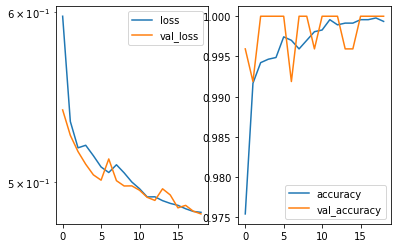

Predicted cell: Landmark Probability: [[0.9999685]]
True Cell type: Landmark
x [[0.5456349]]
True positional value x 0.5
y [[0.4538534]]
True positional value y 0.34375


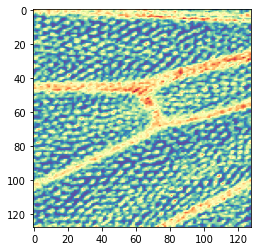

Epoch 20/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.5002 - accuracy: 0.9944 - val_loss: 0.4867 - val_accuracy: 1.0000

Epoch 00020: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.48672659198443097, 'val_accuracy': 1.0, 'loss': 0.5001709573863916, 'accuracy': 0.99443495, 'lr': 1e-04}


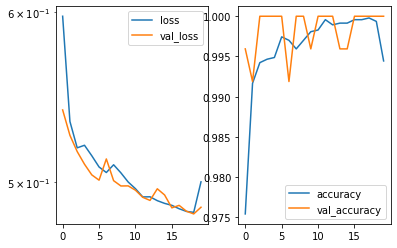

Predicted cell: Landmark Probability: [[0.9999906]]
True Cell type: Landmark
x [[0.39635685]]
True positional value x 0.34375
y [[0.34480897]]
True positional value y 0.34375


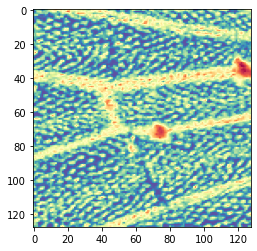

Epoch 21/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4971 - accuracy: 0.9964 - val_loss: 0.4862 - val_accuracy: 1.0000

Epoch 00021: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.48621376452407217, 'val_accuracy': 1.0, 'loss': 0.4970793389294246, 'accuracy': 0.9963613, 'lr': 1e-04}


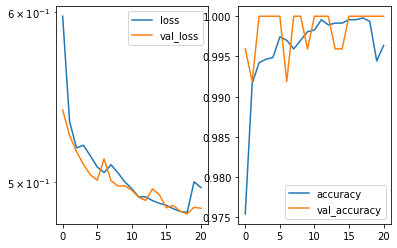

Predicted cell: Landmark Probability: [[0.99999905]]
True Cell type: Landmark
x [[0.4361252]]
True positional value x 0.34375
y [[0.4475326]]
True positional value y 0.34375


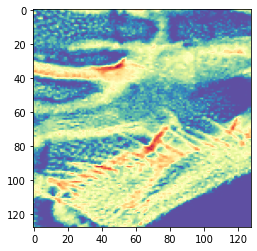

Epoch 22/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4869 - accuracy: 0.9985 - val_loss: 0.4846 - val_accuracy: 1.0000

Epoch 00022: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.48463100509914925, 'val_accuracy': 1.0, 'loss': 0.48690496895411245, 'accuracy': 0.9985017, 'lr': 1e-04}


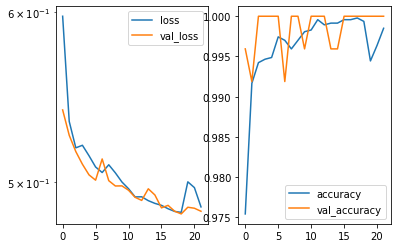

Predicted cell: Landmark Probability: [[0.99838006]]
True Cell type: Landmark
x [[0.3907518]]
True positional value x 0.34375
y [[0.3825737]]
True positional value y 0.34375


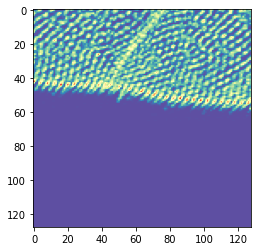

Epoch 23/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4828 - accuracy: 0.9989 - val_loss: 0.4834 - val_accuracy: 1.0000

Epoch 00023: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.48338982511342055, 'val_accuracy': 1.0, 'loss': 0.48278545973541803, 'accuracy': 0.9989298, 'lr': 1e-04}


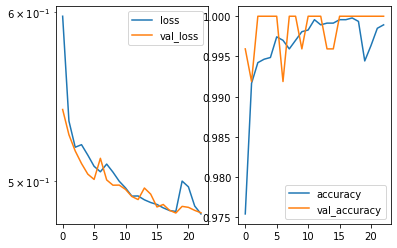

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.5425381]]
True positional value x 0.578125
y [[0.4623611]]
True positional value y 0.578125


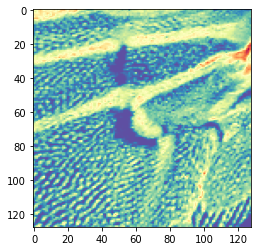

Epoch 24/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4814 - accuracy: 0.9991 - val_loss: 0.4815 - val_accuracy: 1.0000

Epoch 00024: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.48154822864183566, 'val_accuracy': 1.0, 'loss': 0.48136371592289373, 'accuracy': 0.99914384, 'lr': 1e-04}


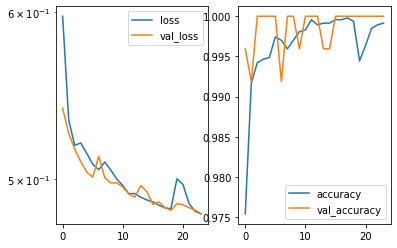

Predicted cell: Landmark Probability: [[0.9193513]]
True Cell type: Landmark
x [[0.5356203]]
True positional value x 0.65625
y [[0.6575134]]
True positional value y 0.65625


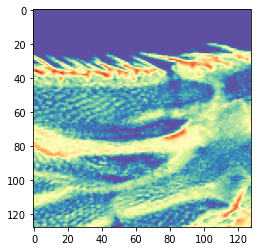

Epoch 25/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4806 - accuracy: 0.9989 - val_loss: 0.4796 - val_accuracy: 1.0000

Epoch 00025: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.47962784427937455, 'val_accuracy': 1.0, 'loss': 0.4805959391292848, 'accuracy': 0.9989298, 'lr': 1e-04}


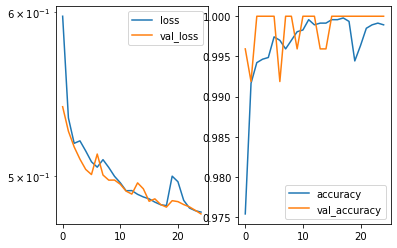

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.5601443]]
True positional value x 0.578125
y [[0.4179024]]
True positional value y 0.421875


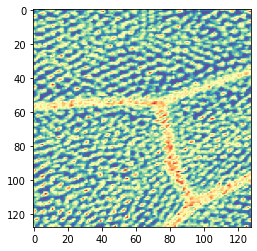

Epoch 26/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4803 - accuracy: 0.9985 - val_loss: 0.4776 - val_accuracy: 1.0000

Epoch 00026: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.4776097162952268, 'val_accuracy': 1.0, 'loss': 0.4803425862313542, 'accuracy': 0.9985017, 'lr': 1e-04}


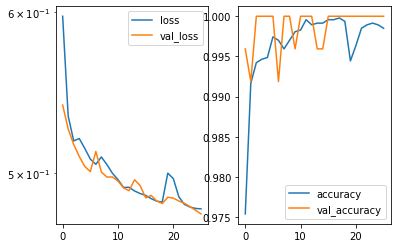

Predicted cell: Landmark Probability: [[0.9999931]]
True Cell type: Landmark
x [[0.6165015]]
True positional value x 0.578125
y [[0.6018609]]
True positional value y 0.578125


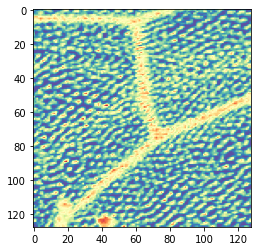

Epoch 27/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4765 - accuracy: 0.9998 - val_loss: 0.4766 - val_accuracy: 1.0000

Epoch 00027: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.4766207051470997, 'val_accuracy': 1.0, 'loss': 0.4765175540663608, 'accuracy': 0.99978596, 'lr': 1e-04}


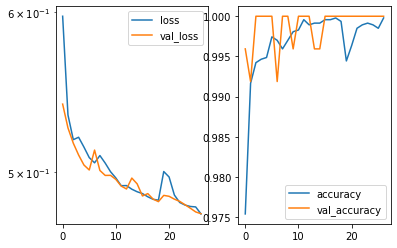

Predicted cell: Landmark Probability: [[0.9999896]]
True Cell type: Landmark
x [[0.4168572]]
True positional value x 0.34375
y [[0.313474]]
True positional value y 0.34375


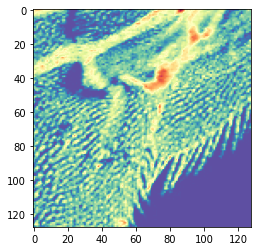

Epoch 28/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4757 - accuracy: 0.9994 - val_loss: 0.4764 - val_accuracy: 1.0000

Epoch 00028: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.4764372590111523, 'val_accuracy': 1.0, 'loss': 0.4756819265575646, 'accuracy': 0.9993579, 'lr': 1e-04}


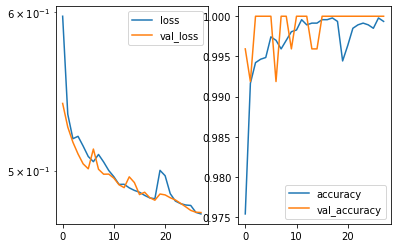

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.46779096]]
True positional value x 0.5
y [[0.56077856]]
True positional value y 0.578125


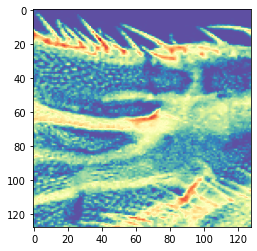

Epoch 29/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4750 - accuracy: 0.9994 - val_loss: 0.4749 - val_accuracy: 1.0000

Epoch 00029: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.47486999509780387, 'val_accuracy': 1.0, 'loss': 0.47503092492075816, 'accuracy': 0.9993579, 'lr': 1e-04}


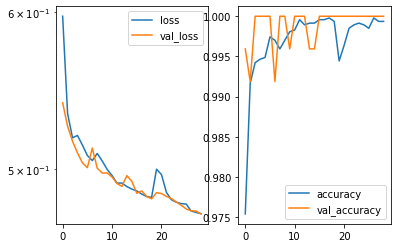

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.50839406]]
True positional value x 0.5
y [[0.33676437]]
True positional value y 0.34375


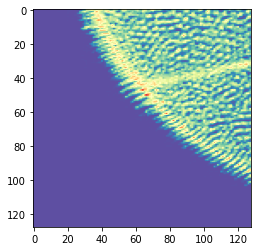

Epoch 30/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4741 - accuracy: 0.9994 - val_loss: 0.4748 - val_accuracy: 1.0000

Epoch 00030: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.4747693150993285, 'val_accuracy': 1.0, 'loss': 0.4740919822903529, 'accuracy': 0.9993579, 'lr': 1e-04}


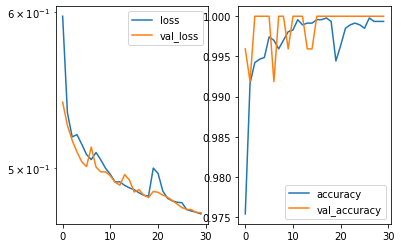

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.59857327]]
True positional value x 0.578125
y [[0.61812145]]
True positional value y 0.578125


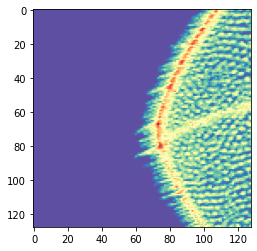

Epoch 31/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4723 - accuracy: 0.9998 - val_loss: 0.4726 - val_accuracy: 1.0000

Epoch 00031: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.4725812402197985, 'val_accuracy': 1.0, 'loss': 0.47225816302920043, 'accuracy': 0.99978596, 'lr': 1e-04}


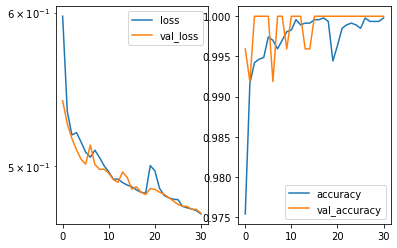

Predicted cell: Landmark Probability: [[0.9999795]]
True Cell type: Landmark
x [[0.42776716]]
True positional value x 0.421875
y [[0.50941366]]
True positional value y 0.5


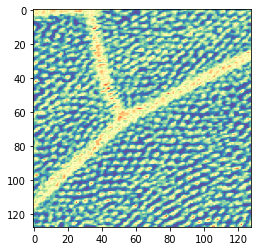

Epoch 32/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4709 - accuracy: 1.0000 - val_loss: 0.4719 - val_accuracy: 1.0000

Epoch 00032: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.4719415544494381, 'val_accuracy': 1.0, 'loss': 0.47085084112947934, 'accuracy': 1.0, 'lr': 1e-04}


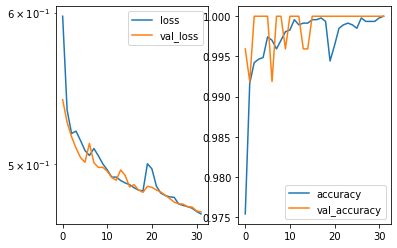

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.48213056]]
True positional value x 0.5
y [[0.5727649]]
True positional value y 0.578125


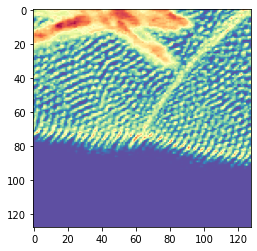

Epoch 33/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4701 - accuracy: 1.0000 - val_loss: 0.4710 - val_accuracy: 1.0000

Epoch 00033: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.4710436705651322, 'val_accuracy': 1.0, 'loss': 0.47009782880952916, 'accuracy': 1.0, 'lr': 1e-04}


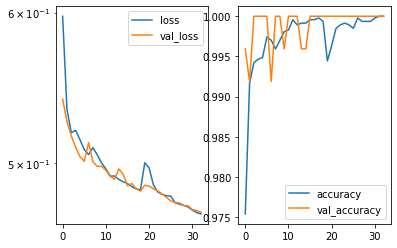

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.47170407]]
True positional value x 0.5
y [[0.6752443]]
True positional value y 0.65625


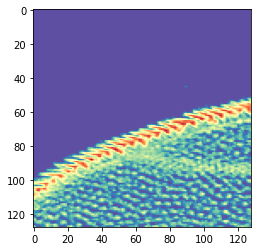

Epoch 34/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4690 - accuracy: 1.0000 - val_loss: 0.4706 - val_accuracy: 1.0000

Epoch 00034: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.4705591090326387, 'val_accuracy': 1.0, 'loss': 0.4690376045947818, 'accuracy': 1.0, 'lr': 1e-04}


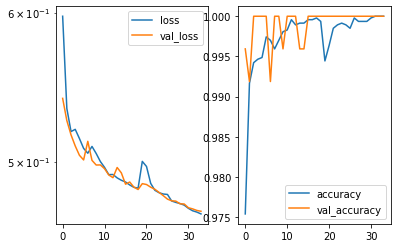

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.3153255]]
True positional value x 0.34375
y [[0.5232282]]
True positional value y 0.5


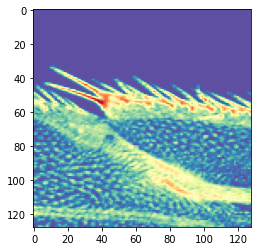

Epoch 35/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4682 - accuracy: 1.0000 - val_loss: 0.4690 - val_accuracy: 1.0000

Epoch 00035: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.469036291285259, 'val_accuracy': 1.0, 'loss': 0.4682333807218565, 'accuracy': 1.0, 'lr': 1e-04}


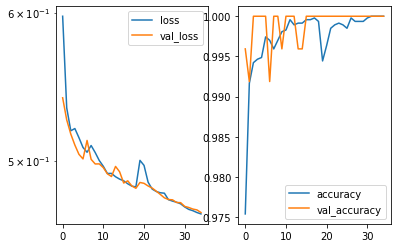

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.6483323]]
True positional value x 0.65625
y [[0.485003]]
True positional value y 0.5


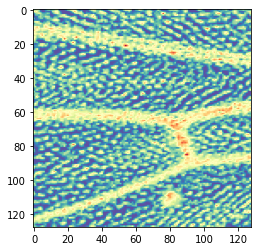

Epoch 36/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4673 - accuracy: 1.0000 - val_loss: 0.4692 - val_accuracy: 1.0000

Epoch 00036: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.4692217940237464, 'val_accuracy': 1.0, 'loss': 0.4673314555739499, 'accuracy': 1.0, 'lr': 1e-04}


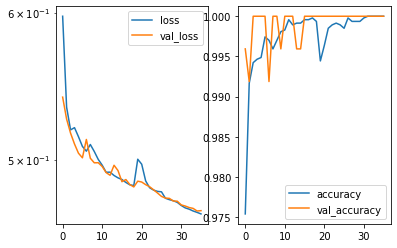

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.56061524]]
True positional value x 0.578125
y [[0.41477358]]
True positional value y 0.421875


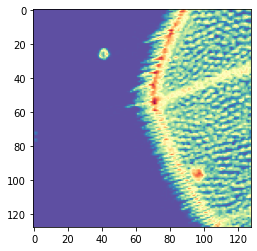

Epoch 37/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4676 - accuracy: 0.9996 - val_loss: 0.4692 - val_accuracy: 1.0000

Epoch 00037: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.4692475192430543, 'val_accuracy': 1.0, 'loss': 0.46758489712613494, 'accuracy': 0.9995719, 'lr': 1e-04}


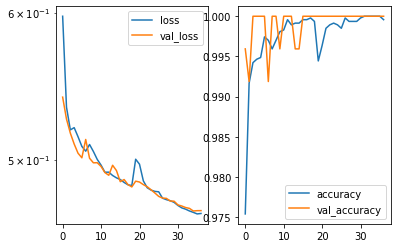

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.5321401]]
True positional value x 0.578125
y [[0.54226017]]
True positional value y 0.578125


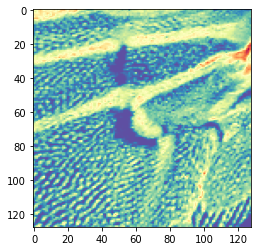

Epoch 38/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4664 - accuracy: 0.9998 - val_loss: 0.4677 - val_accuracy: 1.0000

Epoch 00038: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.46769153199544766, 'val_accuracy': 1.0, 'loss': 0.46638489876912065, 'accuracy': 0.99978596, 'lr': 1e-04}


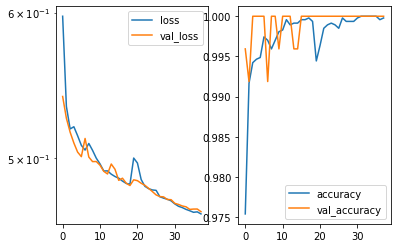

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.44152826]]
True positional value x 0.421875
y [[0.53820103]]
True positional value y 0.578125


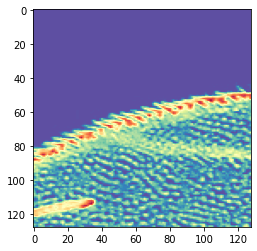

Epoch 39/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4652 - accuracy: 1.0000 - val_loss: 0.4663 - val_accuracy: 1.0000

Epoch 00039: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.4663236133935975, 'val_accuracy': 1.0, 'loss': 0.4651681726083976, 'accuracy': 1.0, 'lr': 1e-04}


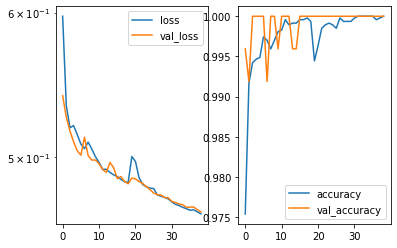

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.31785125]]
True positional value x 0.34375
y [[0.3145376]]
True positional value y 0.34375


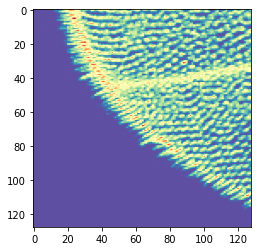

Epoch 40/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4638 - accuracy: 1.0000 - val_loss: 0.4651 - val_accuracy: 1.0000

Epoch 00040: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.4651122243423772, 'val_accuracy': 1.0, 'loss': 0.463814979597722, 'accuracy': 1.0, 'lr': 1e-04}


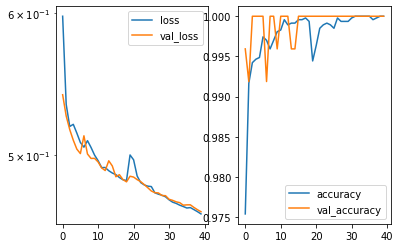

Predicted cell: Landmark Probability: [[0.9999956]]
True Cell type: Landmark
x [[0.6092318]]
True positional value x 0.578125
y [[0.45751616]]
True positional value y 0.421875


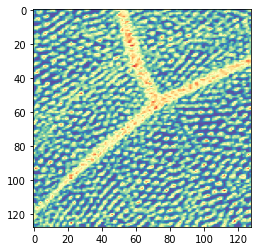

Epoch 41/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4629 - accuracy: 1.0000 - val_loss: 0.4646 - val_accuracy: 1.0000

Epoch 00041: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.464635871774782, 'val_accuracy': 1.0, 'loss': 0.462867085872958, 'accuracy': 1.0, 'lr': 1e-04}


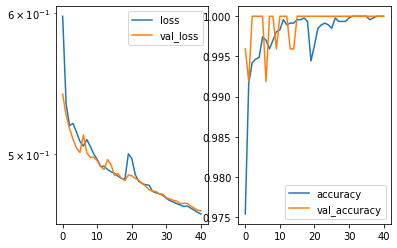

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.531422]]
True positional value x 0.65625
y [[0.54812884]]
True positional value y 0.65625


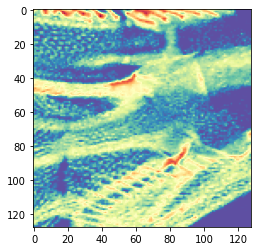

Epoch 42/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4619 - accuracy: 1.0000 - val_loss: 0.4629 - val_accuracy: 1.0000

Epoch 00042: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.4629338965183351, 'val_accuracy': 1.0, 'loss': 0.4619056897059287, 'accuracy': 1.0, 'lr': 1e-04}


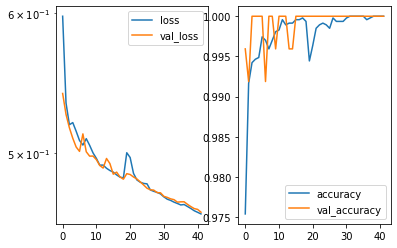

Predicted cell: Landmark Probability: [[0.9999995]]
True Cell type: Landmark
x [[0.6828063]]
True positional value x 0.65625
y [[0.6816021]]
True positional value y 0.65625


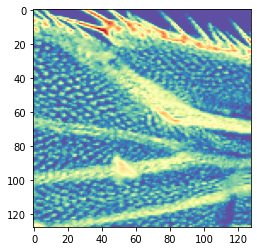

Epoch 43/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4611 - accuracy: 1.0000 - val_loss: 0.4631 - val_accuracy: 1.0000

Epoch 00043: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.46309320131937665, 'val_accuracy': 1.0, 'loss': 0.46110959752934844, 'accuracy': 1.0, 'lr': 1e-04}


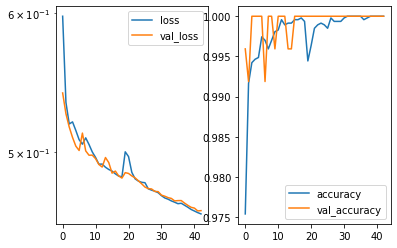

Predicted cell: Landmark Probability: [[0.9999746]]
True Cell type: Landmark
x [[0.31988674]]
True positional value x 0.34375
y [[0.67914367]]
True positional value y 0.65625


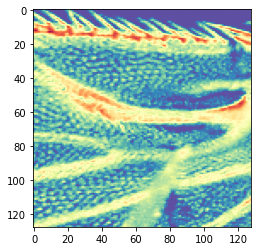

Epoch 44/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4601 - accuracy: 1.0000 - val_loss: 0.4614 - val_accuracy: 1.0000

Epoch 00044: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.46137987767777794, 'val_accuracy': 1.0, 'loss': 0.460129718934122, 'accuracy': 1.0, 'lr': 1e-04}


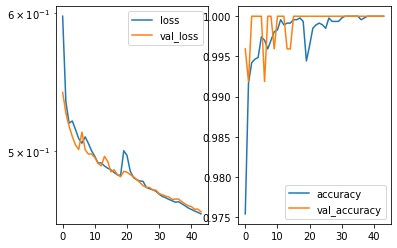

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.5755554]]
True positional value x 0.578125
y [[0.44491664]]
True positional value y 0.421875


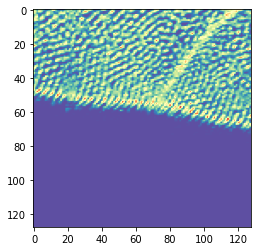

Epoch 45/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4592 - accuracy: 1.0000 - val_loss: 0.4612 - val_accuracy: 1.0000

Epoch 00045: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.46120349033092095, 'val_accuracy': 1.0, 'loss': 0.45924593966250143, 'accuracy': 1.0, 'lr': 1e-04}


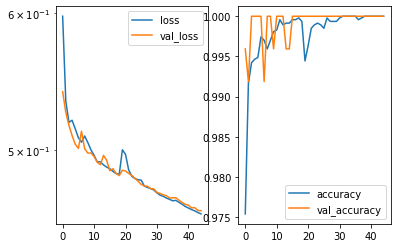

Predicted cell: Background Probability: [[1.]]
True Cell type: Background
x [[0.49047914]]
True positional value x 0.5
y [[0.50436306]]
True positional value y 0.5


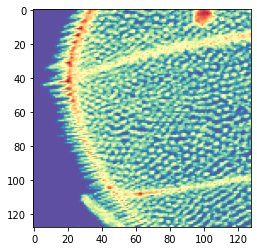

Epoch 46/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4585 - accuracy: 1.0000 - val_loss: 0.4596 - val_accuracy: 1.0000

Epoch 00046: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.4596107119951791, 'val_accuracy': 1.0, 'loss': 0.4584840968863605, 'accuracy': 1.0, 'lr': 1e-04}


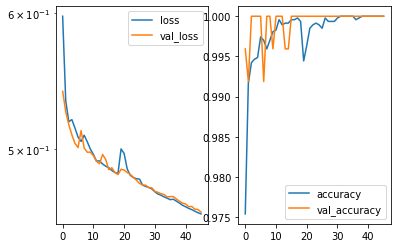

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.45535755]]
True positional value x 0.5
y [[0.64611435]]
True positional value y 0.65625


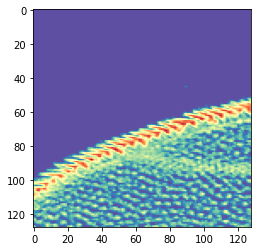

Epoch 47/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4576 - accuracy: 1.0000 - val_loss: 0.4601 - val_accuracy: 1.0000

Epoch 00047: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.46013305196917154, 'val_accuracy': 1.0, 'loss': 0.4575946054051388, 'accuracy': 1.0, 'lr': 1e-04}


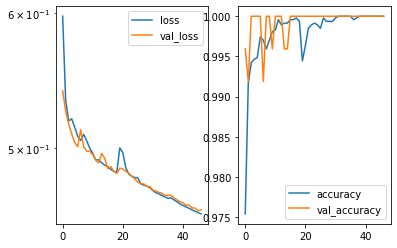

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.5720541]]
True positional value x 0.578125
y [[0.44315076]]
True positional value y 0.421875


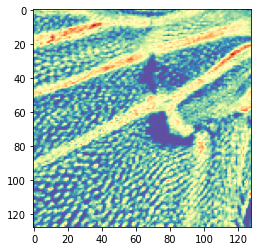

Epoch 48/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4567 - accuracy: 1.0000 - val_loss: 0.4596 - val_accuracy: 1.0000

Epoch 00048: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.45964424445377133, 'val_accuracy': 1.0, 'loss': 0.45665496825049184, 'accuracy': 1.0, 'lr': 1e-04}


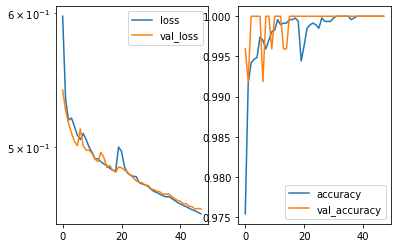

Predicted cell: Landmark Probability: [[0.9999999]]
True Cell type: Landmark
x [[0.5362916]]
True positional value x 0.578125
y [[0.55901486]]
True positional value y 0.578125


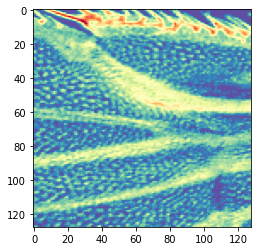

Epoch 49/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4558 - accuracy: 1.0000 - val_loss: 0.4569 - val_accuracy: 1.0000

Epoch 00049: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.45693162762052647, 'val_accuracy': 1.0, 'loss': 0.45579487700270466, 'accuracy': 1.0, 'lr': 1e-04}


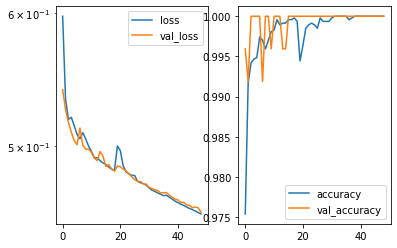

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.50300336]]
True positional value x 0.5
y [[0.5556177]]
True positional value y 0.578125


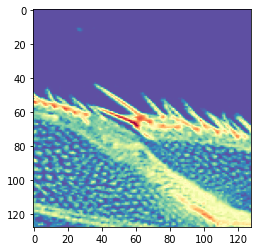

Epoch 50/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4550 - accuracy: 1.0000 - val_loss: 0.4562 - val_accuracy: 1.0000

Epoch 00050: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.45621453843465665, 'val_accuracy': 1.0, 'loss': 0.45499391196780414, 'accuracy': 1.0, 'lr': 1e-04}


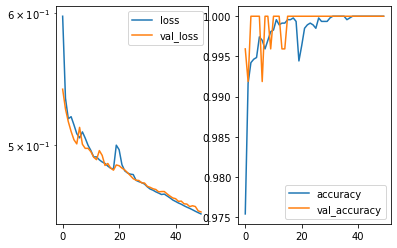

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.51022756]]
True positional value x 0.5
y [[0.47586763]]
True positional value y 0.5


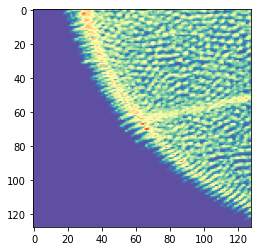

Epoch 51/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4541 - accuracy: 1.0000 - val_loss: 0.4556 - val_accuracy: 1.0000

Epoch 00051: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.45563824923057866, 'val_accuracy': 1.0, 'loss': 0.4540684653624688, 'accuracy': 1.0, 'lr': 1e-04}


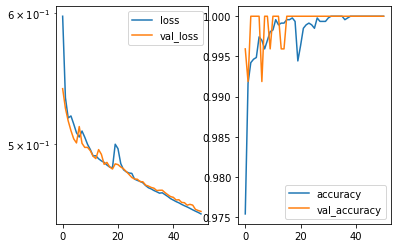

Predicted cell: Landmark Probability: [[0.99999654]]
True Cell type: Landmark
x [[0.5019219]]
True positional value x 0.5
y [[0.3285377]]
True positional value y 0.34375


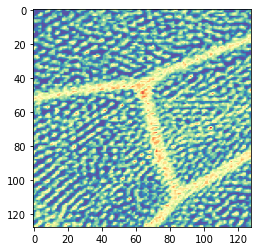

Epoch 52/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4534 - accuracy: 1.0000 - val_loss: 0.4552 - val_accuracy: 1.0000

Epoch 00052: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.45519297515473717, 'val_accuracy': 1.0, 'loss': 0.4533565628074416, 'accuracy': 1.0, 'lr': 1e-04}


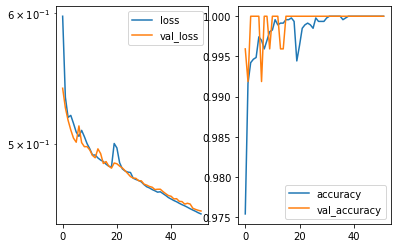

Predicted cell: Landmark Probability: [[0.99999046]]
True Cell type: Landmark
x [[0.4817491]]
True positional value x 0.5
y [[0.6707827]]
True positional value y 0.65625


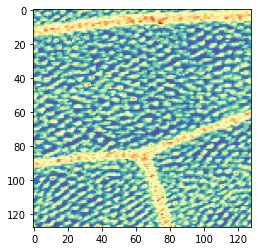

Epoch 53/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4526 - accuracy: 1.0000 - val_loss: 0.4538 - val_accuracy: 1.0000

Epoch 00053: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.45380035696960075, 'val_accuracy': 1.0, 'loss': 0.45259529179957225, 'accuracy': 1.0, 'lr': 1e-04}


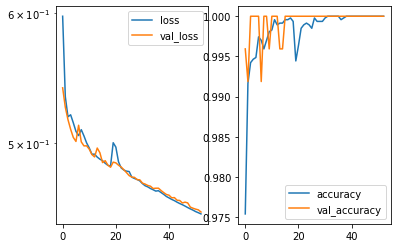

Predicted cell: Landmark Probability: [[0.9999999]]
True Cell type: Landmark
x [[0.38522667]]
True positional value x 0.34375
y [[0.46152398]]
True positional value y 0.5


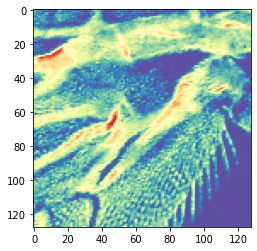

Epoch 54/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4515 - accuracy: 1.0000 - val_loss: 0.4528 - val_accuracy: 1.0000

Epoch 00054: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.45281977600198453, 'val_accuracy': 1.0, 'loss': 0.451540981215259, 'accuracy': 1.0, 'lr': 1e-04}


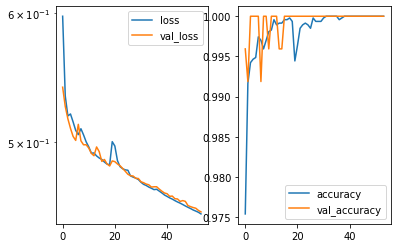

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.5039212]]
True positional value x 0.5
y [[0.4552209]]
True positional value y 0.421875


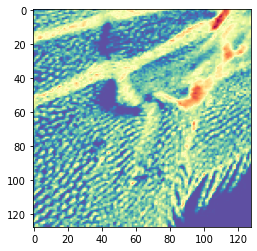

Epoch 55/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4507 - accuracy: 1.0000 - val_loss: 0.4528 - val_accuracy: 1.0000

Epoch 00055: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.4527946492520774, 'val_accuracy': 1.0, 'loss': 0.45071509767527856, 'accuracy': 1.0, 'lr': 1e-04}


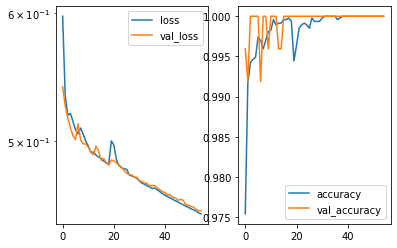

Predicted cell: Landmark Probability: [[0.99999976]]
True Cell type: Landmark
x [[0.55144894]]
True positional value x 0.5
y [[0.6576054]]
True positional value y 0.65625


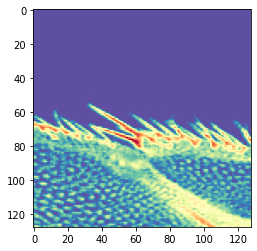

Epoch 56/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4499 - accuracy: 1.0000 - val_loss: 0.4513 - val_accuracy: 1.0000

Epoch 00056: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.45133165227688427, 'val_accuracy': 1.0, 'loss': 0.4498878152250019, 'accuracy': 1.0, 'lr': 1e-04}


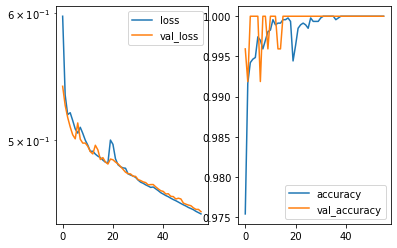

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.5666027]]
True positional value x 0.578125
y [[0.6039135]]
True positional value y 0.578125


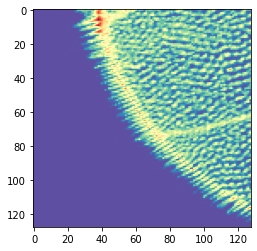

Epoch 57/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4490 - accuracy: 1.0000 - val_loss: 0.4505 - val_accuracy: 1.0000

Epoch 00057: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.45047873161672575, 'val_accuracy': 1.0, 'loss': 0.448998970324046, 'accuracy': 1.0, 'lr': 1e-04}


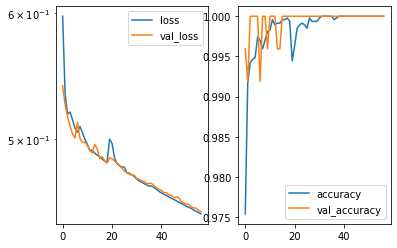

Predicted cell: Landmark Probability: [[0.9999554]]
True Cell type: Landmark
x [[0.66706306]]
True positional value x 0.6562499999999998
y [[0.5070816]]
True positional value y 0.5


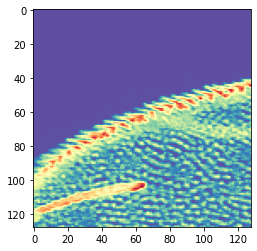

Epoch 58/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4482 - accuracy: 1.0000 - val_loss: 0.4496 - val_accuracy: 1.0000

Epoch 00058: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.44960415048327873, 'val_accuracy': 1.0, 'loss': 0.4481608898264088, 'accuracy': 1.0, 'lr': 1e-04}


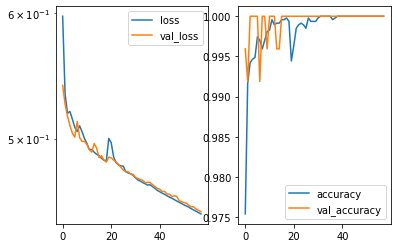

Predicted cell: Landmark Probability: [[0.99999917]]
True Cell type: Landmark
x [[0.54260427]]
True positional value x 0.5
y [[0.65217096]]
True positional value y 0.65625


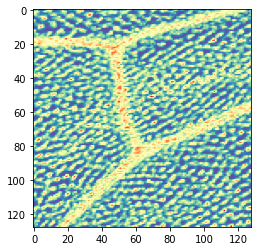

Epoch 59/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4473 - accuracy: 1.0000 - val_loss: 0.4487 - val_accuracy: 1.0000

Epoch 00059: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.44866603128309174, 'val_accuracy': 1.0, 'loss': 0.44734663461424307, 'accuracy': 1.0, 'lr': 1e-04}


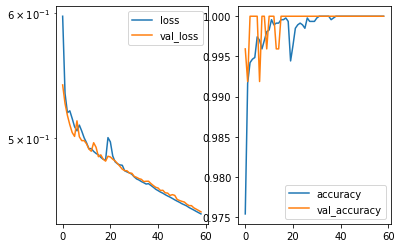

Predicted cell: Landmark Probability: [[0.99999416]]
True Cell type: Landmark
x [[0.63916403]]
True positional value x 0.65625
y [[0.33290946]]
True positional value y 0.34375


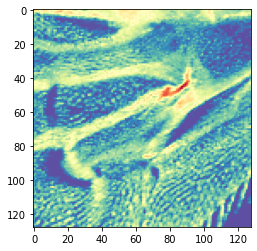

Epoch 60/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4466 - accuracy: 1.0000 - val_loss: 0.4488 - val_accuracy: 1.0000

Epoch 00060: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.44879002154358033, 'val_accuracy': 1.0, 'loss': 0.44655059002441905, 'accuracy': 1.0, 'lr': 1e-04}


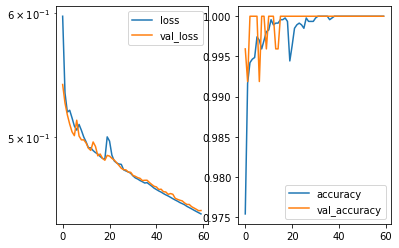

Predicted cell: Landmark Probability: [[0.9999999]]
True Cell type: Landmark
x [[0.55439293]]
True positional value x 0.578125
y [[0.5233164]]
True positional value y 0.578125


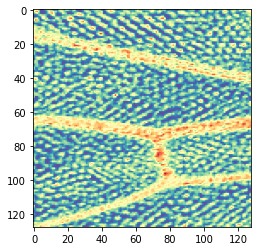

Epoch 61/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4457 - accuracy: 1.0000 - val_loss: 0.4474 - val_accuracy: 1.0000

Epoch 00061: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.44739440035044664, 'val_accuracy': 1.0, 'loss': 0.44570995610819697, 'accuracy': 1.0, 'lr': 1e-04}


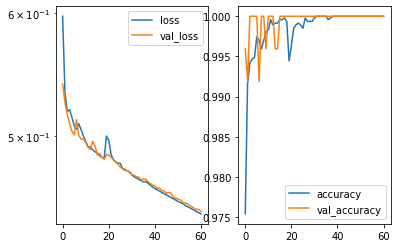

Predicted cell: Landmark Probability: [[0.99991655]]
True Cell type: Landmark
x [[0.34458724]]
True positional value x 0.34375
y [[0.6710506]]
True positional value y 0.65625


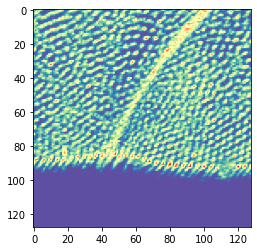

Epoch 62/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4449 - accuracy: 1.0000 - val_loss: 0.4463 - val_accuracy: 1.0000

Epoch 00062: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.44625067492810694, 'val_accuracy': 1.0, 'loss': 0.4448710557532637, 'accuracy': 1.0, 'lr': 1e-04}


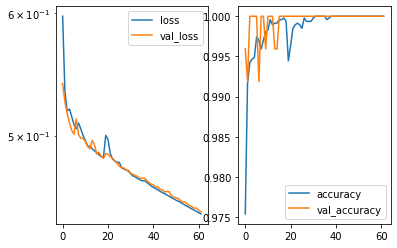

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.41830632]]
True positional value x 0.5
y [[0.57319397]]
True positional value y 0.65625


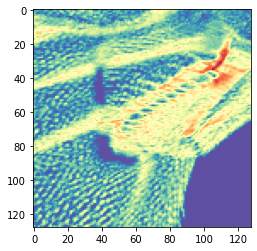

Epoch 63/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4441 - accuracy: 1.0000 - val_loss: 0.4455 - val_accuracy: 1.0000

Epoch 00063: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.4455043942463107, 'val_accuracy': 1.0, 'loss': 0.44409795019979753, 'accuracy': 1.0, 'lr': 1e-04}


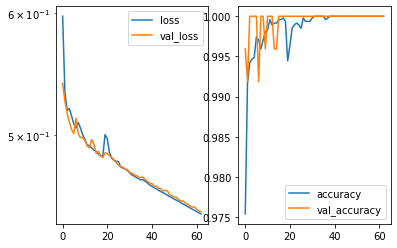

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.6013196]]
True positional value x 0.578125
y [[0.41020495]]
True positional value y 0.421875


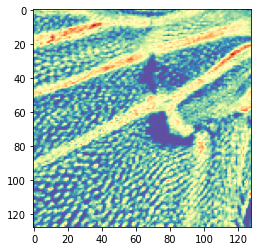

Epoch 64/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4433 - accuracy: 1.0000 - val_loss: 0.4448 - val_accuracy: 1.0000

Epoch 00064: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.4448027528398405, 'val_accuracy': 1.0, 'loss': 0.44333193106704377, 'accuracy': 1.0, 'lr': 1e-04}


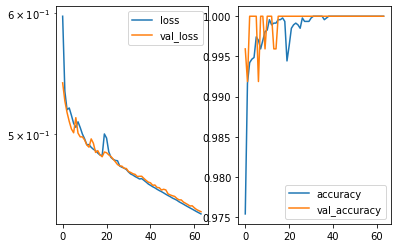

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.57624084]]
True positional value x 0.578125
y [[0.606292]]
True positional value y 0.578125


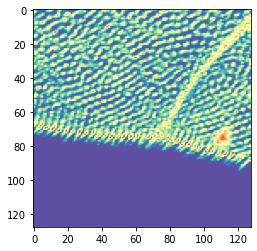

Epoch 65/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4424 - accuracy: 1.0000 - val_loss: 0.4440 - val_accuracy: 1.0000

Epoch 00065: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.44399323914109207, 'val_accuracy': 1.0, 'loss': 0.4424394255708138, 'accuracy': 1.0, 'lr': 1e-04}


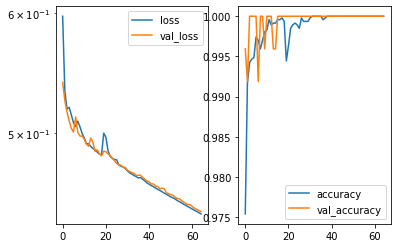

Predicted cell: Landmark Probability: [[0.99999964]]
True Cell type: Landmark
x [[0.512468]]
True positional value x 0.5
y [[0.6329381]]
True positional value y 0.65625


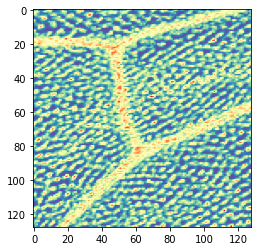

Epoch 66/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4416 - accuracy: 1.0000 - val_loss: 0.4430 - val_accuracy: 1.0000

Epoch 00066: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.44298156756695695, 'val_accuracy': 1.0, 'loss': 0.44162543746961713, 'accuracy': 1.0, 'lr': 1e-04}


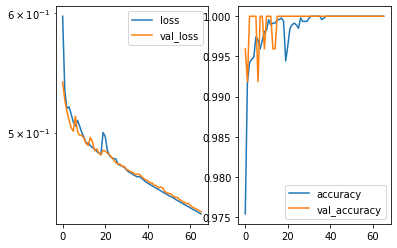

Predicted cell: Landmark Probability: [[0.9999999]]
True Cell type: Landmark
x [[0.3297572]]
True positional value x 0.34375
y [[0.6424379]]
True positional value y 0.65625


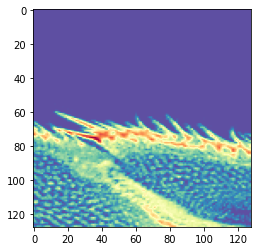

Epoch 67/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4408 - accuracy: 1.0000 - val_loss: 0.4425 - val_accuracy: 1.0000

Epoch 00067: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.44245428161892464, 'val_accuracy': 1.0, 'loss': 0.4408075343689894, 'accuracy': 1.0, 'lr': 1e-04}


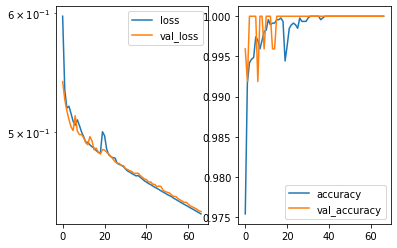

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.66026974]]
True positional value x 0.578125
y [[0.5202404]]
True positional value y 0.5


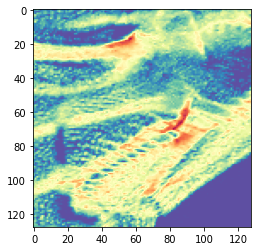

Epoch 68/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4400 - accuracy: 1.0000 - val_loss: 0.4417 - val_accuracy: 1.0000

Epoch 00068: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.44173944771774415, 'val_accuracy': 1.0, 'loss': 0.44003028848706044, 'accuracy': 1.0, 'lr': 1e-04}


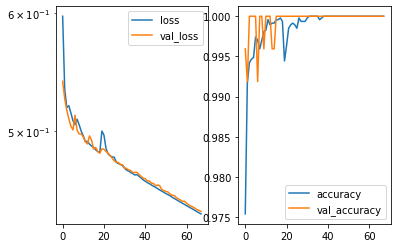

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.6693854]]
True positional value x 0.65625
y [[0.48935068]]
True positional value y 0.5


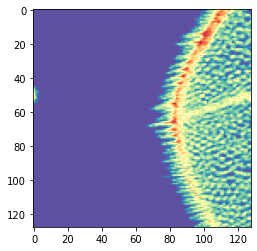

Epoch 69/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4392 - accuracy: 1.0000 - val_loss: 0.4412 - val_accuracy: 1.0000

Epoch 00069: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.4411964971360152, 'val_accuracy': 1.0, 'loss': 0.43921693650469795, 'accuracy': 1.0, 'lr': 1e-04}


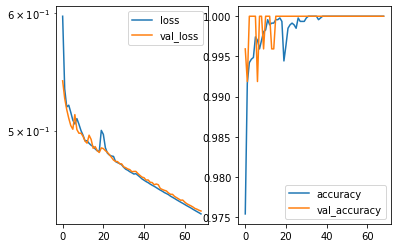

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.492191]]
True positional value x 0.5
y [[0.5837399]]
True positional value y 0.578125


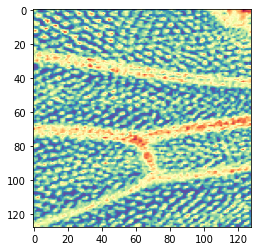

Epoch 70/250
4672/4672 [==============================] - 95s 20ms/step - loss: 0.4384 - accuracy: 1.0000 - val_loss: 0.4400 - val_accuracy: 1.0000

Epoch 00070: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.43999477057922176, 'val_accuracy': 1.0, 'loss': 0.43843395154514947, 'accuracy': 1.0, 'lr': 1e-04}


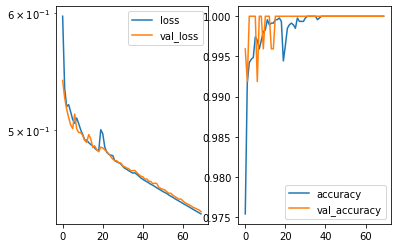

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.32948542]]
True positional value x 0.34375
y [[0.64391494]]
True positional value y 0.65625


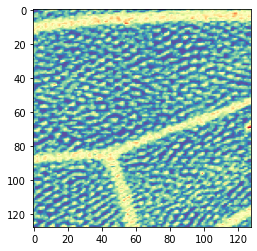

Epoch 71/250
4672/4672 [==============================] - 94s 20ms/step - loss: 0.4376 - accuracy: 1.0000 - val_loss: 0.4399 - val_accuracy: 1.0000

Epoch 00071: saving model to /home/sancere/Kepler/CurieDeepLearningModels/Dalmiro_Laura/Landmark/Landmark128K7s48d56.h5
{'val_loss': 0.43986907383290735, 'val_accuracy': 1.0, 'loss': 0.4375508581862262, 'accuracy': 1.0, 'lr': 1e-04}


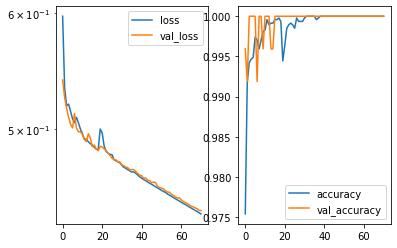

Predicted cell: Landmark Probability: [[1.]]
True Cell type: Landmark
x [[0.43274313]]
True positional value x 0.65625
y [[0.44328097]]
True positional value y 0.65625


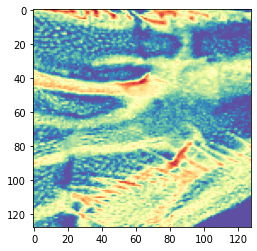

Epoch 72/250
1660/4672 [=========>....................] - ETA: 59s - loss: 0.4374 - accuracy: 1.0000

In [ ]:
static_model = NEATStatic(config, model_dir, model_name)

static_model.loadData()

static_model.TrainModel()
